# **Tutorial** : Which cartographic representation for a point data set ? 
## Overview of some existing techniques using CartAGen

- 🙋 **For whom ?** : 
    - people who have spatial datas to valorize through maps, but don't know how which cartographic representation to choose
    - expert cartographers who would like to discover **cartographic generalization possibilities** offered by the CartAGen tool
    - anyone who wants to learn what are the different issues when making maps from point data set (and how to assess those issues) 


- ❓ **What is CartAGen ?** :
    - an **open source Python library** made by **IGN** (i.e the french national mapping agency) researchers
    - a tool to carry out cartographic generalization processes and **automate** them
    - a **QGIS plugin** to use the Python library in a GIS environment  


- 📗 **How to use this Notebook ?** : 
    - a Notebook is a document that mixes **markdown cells** (i.e. cells with formatted text like this one) and **code cells**, which you can modify and execute at will
    - it comes with a **sample data set** on which you can **test** the various features of the CartAGen python library
    - you can import your **own data** and run the code cells of this Notebook, or use the CartAGen tool in **another environment** (QGIS or python script)

    
- 🔗 **Useful links** : 
    - [Github repository](https://github.com/LostInZoom/cartagen4py?tab=readme-ov-file) 
    - [CartAGen documentation](https://cartagen4py.readthedocs.io/en/latest/index.html)

_by Paul Bourcier, 2024 - CC-BY-SA 4.0_

## ⚙️ **Part 0 :** Preparing the working environment

In [1]:
# Importing libraries

from matplotlib import pyplot as plt # for ploting results, especially maps
import cartagen4py as c4 # the main library, containing cartographic generalization algorithms
import geopandas as gp # used to import and manipulate geographic data
import pandas as pd # used to concatenate datas
import ipywidgets # creation of interactive plots
import os # navigation within the environnement
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar # adding scalebar to the maps
import matplotlib.colors as matcol # generating color palettes
from matplotlib.path import Path  # Plot generation
from matplotlib.patches import PathPatch # Plot generation
from matplotlib.figure import Figure # Plot generation
from mpl_toolkits.axisartist.axislines import Subplot # Plot generation
from shapely.geometry import Polygon, MultiPolygon, Point # Create and manipulate geometries
from shapely.wkt import loads # Create and manipulate geometries
from shapely import intersects
from shapely.ops import linemerge
from tqdm.notebook import tqdm # Creating loading bar
from time import sleep # Creating loading bar
import numpy as np # Using mathematical operations in Python
import re # regex
from IPython.display import clear_output, Image # used to delete widgets
import pydeck as pdk #pydeck for interactive maps
import json #manipulating dictionnaries
import contextily as ctx # Adding basemaps
import random #generating random numbers
import mapclassify #choroplete maps
import matplotlib.colors as mcolors #generating colors 
import matplotlib.cm as cm #used to display colorbar
# from matplotlib.path import Path
# from matplotlib.patches import PathPatch

import warnings # Remove warnings
warnings.filterwarnings("ignore", category=UserWarning, message=".*GeoDataFrame you are attempting to plot is empty.*") # Remove user warning 
warnings.filterwarnings("ignore", category=UserWarning, message=".*CRS not set for some of the concatenation inputs.*.")
#warnings.filterwarnings("ignore", category=SettingWithCopyWarning, message=".*A value is trying to be set on a copy of a slice from a DataFrame.*.")

## ❌ **Part 1 :** Common issues with point data representation

Nowadays, more and more spatial data set shared by data producers take form of point data set, i.e datas associated with x/y coordinate enabling their integration in maps. Those point data sets concern a wide variety of thematic : environnement, population, urbanism, mobilities, etc. 

Let's figure out some issues when cartographying these kind of data.

### **a/** Why displaying raw point data set can induce limitations ?

When creating maps with the purpose of showing the spatial distribution of a phenomenon, displaying every individual point of our dataset can be problematic. Let's take the example of the crepe restaurant in Brittany, France : 

In [5]:
#Displaying maps of crepe restaurants in Brittany
brittany = gp.read_file('data/puntos/brittany.geojson')
crepes = gp.read_file('data/puntos/crepes.geojson')

def plt_bre_1(fig_size):
    
    pbar = tqdm(range(2), total = 2, desc = "displaying datas : ")
    ax = brittany.plot(facecolor = 'None', edgecolor = "grey", linewidth = 0.5, figsize = (fig_size,fig_size))
    pbar.update(1.0)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    scalebar = AnchoredSizeBar(ax.transData,
                            10000,  
                            '10 km',  
                            'lower left',  
                            pad=0.5,
                            color='black',
                            frameon=True,
                            size_vertical=1)
    ax.add_artist(scalebar)

    crepes.plot(ax=ax)
    pbar.update(1.0)
    pbar.close()
ipywidgets.interact(plt_bre_1, fig_size = ipywidgets.IntSlider(value =12, min = 1, max = 16,step = 1,continuous_update=False))

interactive(children=(IntSlider(value=12, continuous_update=False, description='fig_size', max=16, min=1), Out…

<function __main__.plt_bre_1(fig_size)>

💬 This map shows all the crepes restaurant in Brittany that are represented in the [OSM](https://www.openstreetmap.org/#map=14/48.81620/-1.17910) database. Because some points are overlaping eachother, it is difficult to read the spatial distribution of these restaurants. Eventhough we understand that there are more restaurants in the mains cities and in some part of the coast, we can't really say if there are more restaurants in Rennes or Brest, for example. 

💬 Let's try to lower the opacity of the points, so we can see more easily when several points are overlaping 

In [31]:
#Trying to lower the opacity to see if spatial distribution are more readable
def plt_bre_1(fig_size, opacity):
    
    pbar = tqdm(range(2), total = 2, desc = "displaying datas : ")
    ax = brittany.plot(facecolor = 'None', edgecolor = "grey", linewidth = 0.5, figsize = (fig_size,fig_size))
    pbar.update(1.0)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    scalebar = AnchoredSizeBar(ax.transData,
                            10000,  
                            '10 km',  
                            'lower left',  
                            pad=0.5,
                            color='black',
                            frameon=True,
                            size_vertical=1)
    ax.add_artist(scalebar)

    crepes.plot(ax=ax, alpha = opacity)
    pbar.update(1.0)
    pbar.close()
ipywidgets.interact(plt_bre_1, fig_size = ipywidgets.IntSlider(value =12, min = 1, max = 16,step = 1,continuous_update=False),
                               opacity = ipywidgets.FloatSlider(value =1, min = 0, max = 1,step = 0.01,continuous_update=False))

interactive(children=(IntSlider(value=12, continuous_update=False, description='fig_size', max=16, min=1), Flo…

<function __main__.plt_bre_1(fig_size, opacity)>

With this technique, spatial distribution is getting clearer. But it is still not enough to determine in which city there is more crepes restaurants ! We will see some techniques to improve the readibility of the map regarding the spatial distribution of those restaurants in part 2... 

### **b/** Point data sets in multi-scale maps : the persistant problem of scale

Nowadays, geographic data sets are often displayed on interactive maps, i.e maps in which the user can change the current view by zooming or panning. When it comes to point data sets, it is true that this medium offers the possibility to look precisly where the points are located within a desired zone. However, displaying raw data point still generate map readability problems at certain scales.

Let's take the example of parking meters in Paris :

In [2]:
horo = gp.read_file('data/puntos/horodateurs-mobiliers.geojson')

for i in range(len(horo)):
    horo.loc[i,'lon'] = json.loads(horo.loc[i,'geo_point_2d'])['lon']
    horo.loc[i,'lat'] = json.loads(horo.loc[i,'geo_point_2d'])['lat']

mean_latitude = horo.lat.mean()
mean_longitude = horo.lon.mean()
df = horo.drop(columns='geometry')

layer = pdk.Layer(
    "ScatterplotLayer",
    df,
    opacity=0.8,
    stroked=True,
    filled=True,
    radius_scale=6,
    radius_min_pixels=5,
    radius_max_pixels=100,
    line_width_min_pixels=0,
    get_position=["lon", "lat"],
    pickable=True,
)

view_state = pdk.ViewState(longitude=mean_longitude, latitude=mean_latitude, zoom=15, bearing=0, pitch=0)

r = pdk.Deck(layers=[layer],initial_view_state=view_state, map_provider="carto",  map_style="light_no_labels", tooltip={"text": "{numhoro}"})

r.to_html('ScatterplotLayer.html')

This example highlights one fact : when the zoom level is high, displaying every point of our data set is a good idea since we easily understand where is each parking meters (which can be useful to find one in a real context). However, when the zoom level is low (for example when it is possible to see Paris as a whole), the map is saturated of information, raw point representation not being optimized in that case.

In fact, the problem the problem of showing all points at low zoom levels is not only that map is saturated with points, but also that map reader needs most likely change. Indeed, when looking at whole Paris, the need of the map reader is probably not to find the parking meters next to him, but maybe to understand how this equipment is distributed in the city (without understanding the precise location of each of them).

To conclude on this part, interactive maps don't solve the problem cartographic representation of the datas. In other words, there are still needs for transforming it at certain scales, to make the map more readable. Those transforming operations are called cartographic generalization. CartAGen proposes some tools to perform generalization.

## 🛠 **Part 2 :** Exploring cartographic generalization techniques with CartAGen
As we saw, scale is what matter when defining which cartographic representation to choose. Let's explore generalization techniques according to it.

### **a/** Point displacement techniques
At large scale (i.e small zones, high zoom level...), we generally want to keep each point in our representation, to be as close as reality. When points start to overlap eachother, point displacement algorithms can be useful, since they make the map more readable but also keep the number of points on the map.

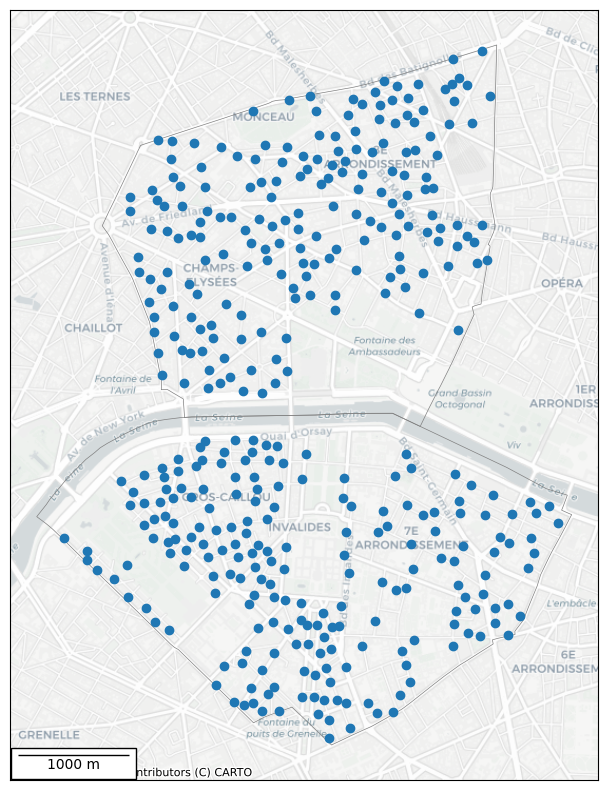

In [3]:
# Display points to displace
admin = gp.read_file('data/puntos/arr_paris.geojson')
admin.to_crs(crs="EPSG:3857",inplace=True)
horo.to_crs(crs="EPSG:3857",inplace=True)
horo_ok = gp.clip(horo, admin.loc[14:15])


ax = admin.loc[14:15].plot(facecolor = 'None', edgecolor = "grey", linewidth = 0.5, figsize = (10,10))
ax.axes.get_xaxis().set_visible(False)
ax.axes.get_yaxis().set_visible(False)
scalebar = AnchoredSizeBar(ax.transData,
                        1000,  
                        '1000 m',  
                        'lower left',  
                        pad=0.5,
                        color='black',
                        frameon=True,
                        size_vertical=1)
ax.add_artist(scalebar)

horo_ok.plot(ax=ax)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)


Yet, there is no algorithm dedicated to point displacement in CartAGen. Nonetheless, it is possible to use the random_displacement algorithm by transforming our points into polygons before : 

In [8]:
# Converting points to polygons by creating buffers
horo_poly = horo_ok.copy()
horo_poly.geometry = horo_poly.geometry.buffer(42)

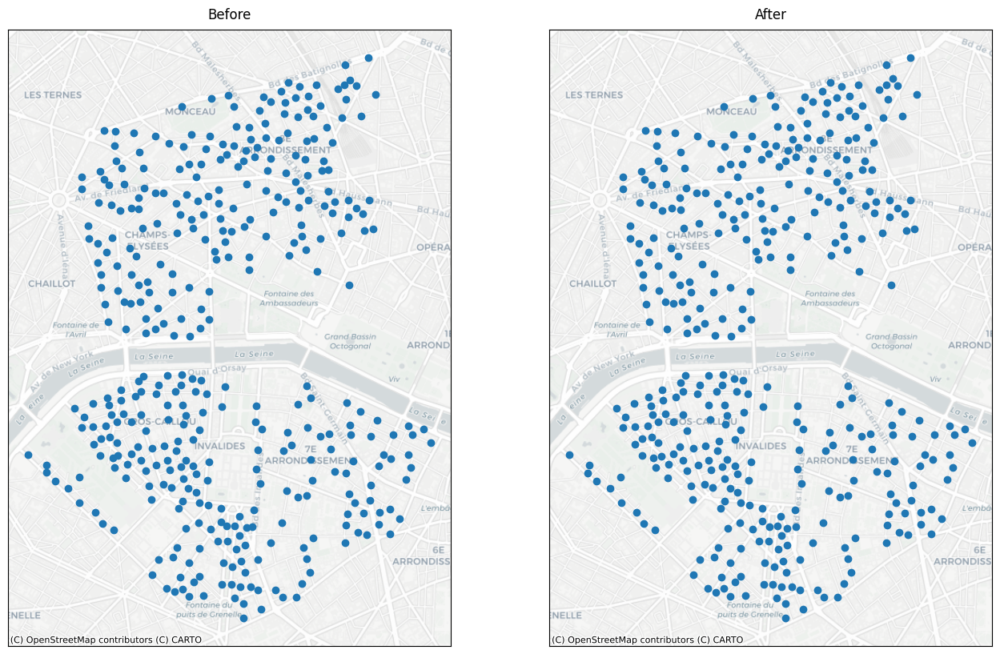

In [5]:
# Displacing point buffers
horo_poly = c4.random_displacement(horo_poly, polygon_distance=10.0, max_trials=10, max_displacement=10.0)
horo_ok = gp.clip(horo, admin.loc[14:15])

fig, axs = plt.subplots(1, 2, figsize = (16,10))

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(np.asarray(horo_ok.geometry.get_coordinates())[:,:1], np.asarray(horo_ok.geometry.get_coordinates())[:,-1])
axs[0].autoscale_view()
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)

axs[1].set_title('After', pad=10, family='sans-serif')
axs[1].scatter(np.asarray(horo_poly.geometry.centroid.get_coordinates())[:,:1], np.asarray(horo_poly.geometry.centroid.get_coordinates())[:,-1])
axs[1].autoscale_view()
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.show()


### **b/** Point reduction techniques
As the scale decreazes, more and more points overlaps eachother, so that displacement become less easy to perform. At this point, having all the points on the map become less important : the map is more about having a global vision of the spatial distribution of the datas. Point reductions algorithms enable these transformations.

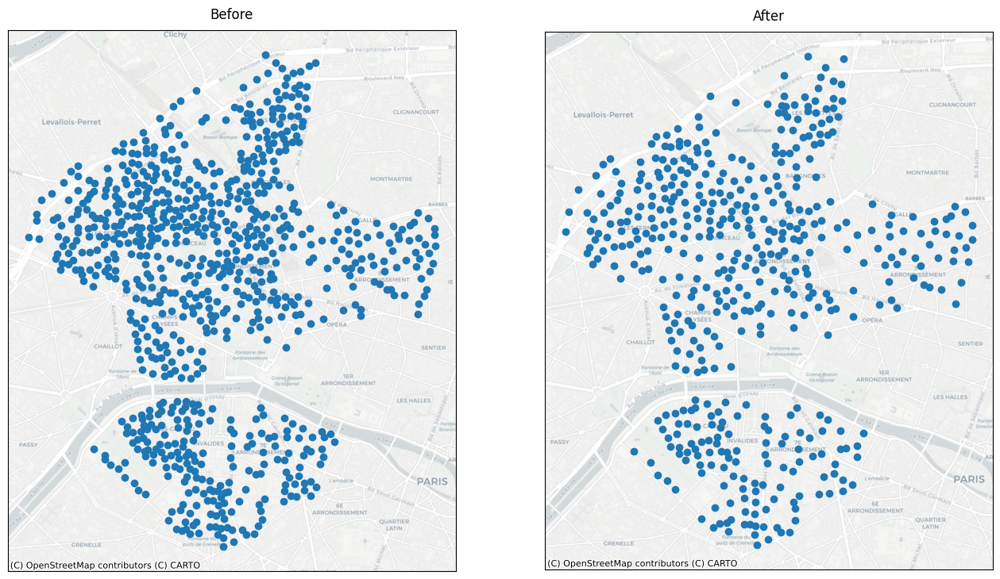

In [5]:
# Reduce_points_kmeans algorithm
horo_ok = gp.clip(horo, admin.loc[13:16])
fig, axs = plt.subplots(1, 2, figsize = (16,10))

horo_red = c4.reduce_points_kmeans(list(horo_ok.geometry),0.6,True)

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo_ok.geometry.get_coordinates())[:,:1], y= np.asarray(horo_ok.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)

axs[1].set_title('After', pad=10, family='sans-serif')
axs[1].scatter(np.asarray([(point.x, point.y) for point in horo_red])[:,:1], np.asarray([(point.x, point.y) for point in horo_red])[:,-1])
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.show()	

The reduce point kmeans algorithm tends to uniformize the spatial distribution of the point data set by deleting more points in areas where the point density is higher. It can be a problem, because there is a risk that cartographic representation doesn't reflect real spatial distribution. Here is another algorithms to reduce the number of points : 

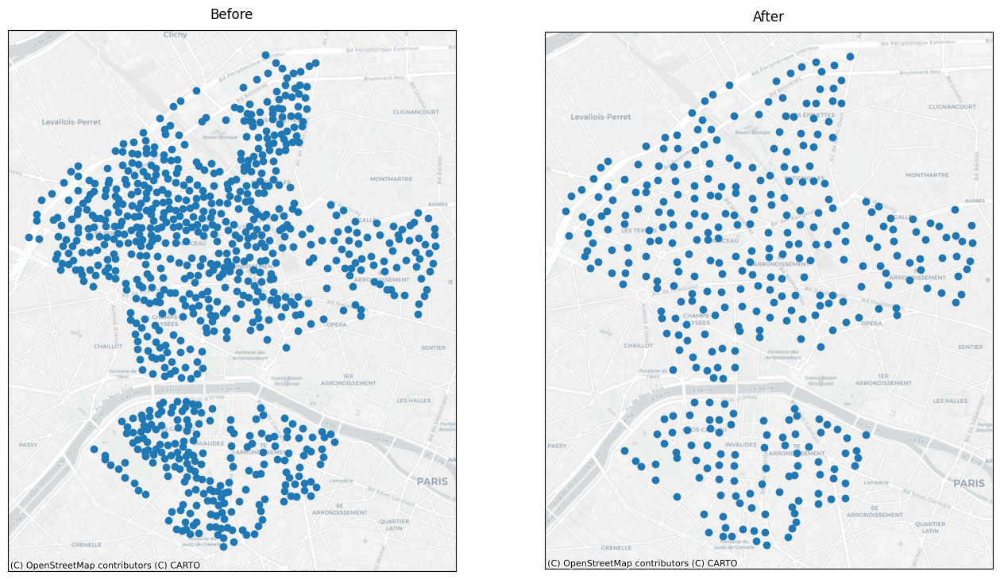

In [12]:
# reduce_points_quadtree algorithm (simplification mode)
fig, axs = plt.subplots(1, 2, figsize = (16,10))
horo_ok = gp.clip(horo, admin.loc[13:16])

# horo_red = c4.reduce_points_quadtree(horo_ok,5,mode='simplification')
# horo_red = [x[0] for x in horo_red[0]]

horo_red = c4.reduce_points_quadtree(horo_ok,5,mode='simplification')
horo_red = gp.GeoDataFrame({'geometry':gp.GeoSeries([x[0] for x in horo_red[0]]),'nb_aggr':[x[2] for x in horo_red[0]]})


axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo_ok.geometry.get_coordinates())[:,:1], y= np.asarray(horo_ok.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)



axs[1].set_title('After', pad=10, family='sans-serif')
axs[1].scatter(np.asarray(horo_red.geometry.get_coordinates())[:,:1], y= np.asarray(horo_red.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.show()

The reduce point quadtree algorithm seems quickerin terms of processing time. It also has the advantage that it is possible to change the size of the points according to the number of deleted points (making the spatial distribution easier to understand). 

It has the disavantage that the reduction strenth can not be thinly set up.

Note that those algorithms delete points based on their position, without dealing with attributes. In others words, if you want to reduce point prior to setting up a symbology based on an attribute value, you should not use those algorithms. Here what you could do. 

In [4]:
# Adding a fake value to parking meters points (let's say the number of places in the parking area)
horo_value = horo.copy()
horo_value['nb_places'] = [random.randint(1, 100) for i in range(len(horo_value))]

horo_value.nb_places.unique()

array([ 45,   6,  54,   4,  80,  72,  39,   8,  47,  99,  28,  21,  31,
        91,  87,  20,  33,  75,  55,   2,  93,   3,  27,  24,  17,  82,
        68,  10,  49,  62,  18,   7,  37,  90,  74,   5,  78,  73,  85,
        51,  52,  81,  12,   9,  71,  77,  16,  69,  11,  14,  88,  42,
        65,  35,  41,  89,  53,  30,  46,  57,  32,  50,  63,  94,  61,
        97,  44,  26,  98,  22,  56,  15,  95,  79,  76,  86,  40,  59,
       100,  25,  83,  13,  58,  96,  43,   1,  92,  48,  19,  38,  66,
        60,  34,  84,  36,  23,  70,  64,  67,  29])

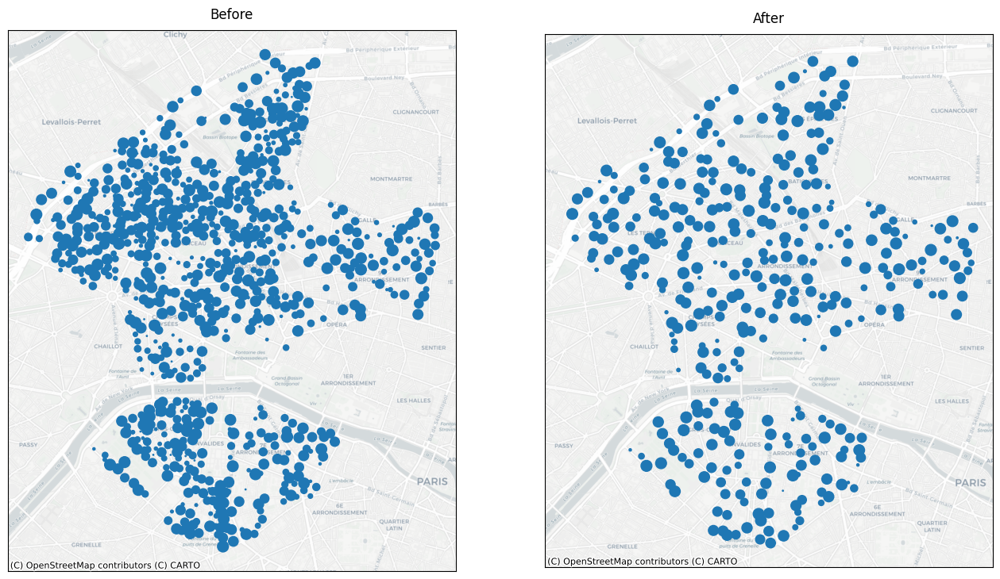

In [15]:
# Using the reduce_points_quadtree algorithm with selection mode 
fig, axs = plt.subplots(1, 2, figsize = (16,10))
horo_value_clp = gp.clip(horo_value, admin.loc[13:16])
extent = horo_value_clp.total_bounds

horo_red = c4.reduce_points_quadtree(horo_value_clp,5,mode='selection',attribute='nb_places')
horo_red = gp.GeoDataFrame({'geometry':gp.GeoSeries([x[0] for x in horo_red[0]]),'numhoro':[x[1] for x in horo_red[0]]})
horo_red = horo_red.merge(right=horo_value, how='left', on = 'numhoro')
horo_red.set_geometry(horo_red.geometry_x, inplace=True)

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo_value_clp.geometry.get_coordinates())[:,:1], y= np.asarray(horo_value_clp.geometry.get_coordinates())[:,-1], s= horo_value_clp.nb_places)
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	


axs[1].set_title('After', pad=10, family='sans-serif')
axs[1].scatter(np.asarray(horo_red.geometry.get_coordinates())[:,:1], y= np.asarray(horo_red.geometry.get_coordinates())[:,-1], s= horo_red.nb_places)
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	
plt.show()

In this case, for each group of points in which the algorithm deletes points, the point with the highest value is kept. However, reduce_point_quadtree algorithm also tends to uniformize the spatial distribution

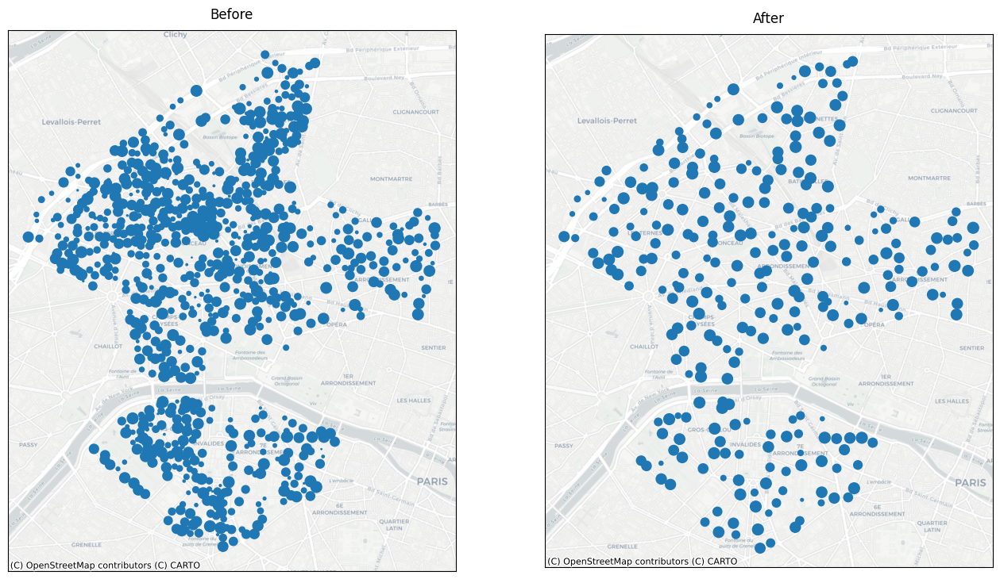

In [8]:
# Using the LabelGrid algorithm with selection mode 

# rename value column to 'value'
horo_value_clp = horo_value_clp.rename(columns={"nb_places":"value"}) 
lg = c4.LabelGrid(horo_value_clp, width = 200, height = 200, typ="hexagonal", mode='selection')
lg.set_point_label_grid()
res = lg.getPointResults()

fig, axs = plt.subplots(1, 2, figsize = (16,10))

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo_ok.geometry.get_coordinates())[:,:1], y= np.asarray(horo_ok.geometry.get_coordinates())[:,-1],s= horo_value_clp.value)
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	


axs[1].set_title('After', pad=10, family='sans-serif')
axs[1].scatter(x=np.asarray(res.geometry.get_coordinates())[:,:1], y= np.asarray(res.geometry.get_coordinates())[:,-1], s=res.value)
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	
plt.show()

The Label Grid algorithm basically do the same, but preserves more the spatial distribution of the points, since the reduction strentgh is the same everywhere (witout taking in account point density)

### **c/** Agregation techniques
At one moment, it becomes useless to represent point data as points on map. Indeed, at smaller scales (at whole Brittany in our first example and at Paris scale in the scond one), there are wether to much information to display, or to much overlaps between points. In cartography, there are several ways to tackle this problem. Agregation is one of those.

Agregation consists of "merging" the information of the points into broader spatial entities (generally a polygon). A common type of agregation is the one made with administrative (or statistical) units.

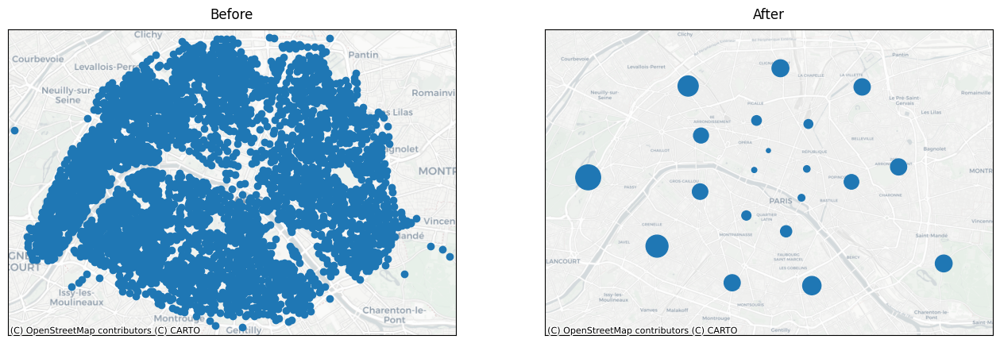

In [12]:
# Agregating points into adminstrative units in Paris
mun = admin.copy()
neigh = gp.read_file('data/puntos/quartier_paris.geojson')
neigh.to_crs(crs="EPSG:3857",inplace=True)
iris = gp.read_file('data/puntos/iris.geojson')
iris.to_crs(crs="EPSG:3857",inplace=True)
unit = 'ID'
value = 'nb_pm'
fig, axs = plt.subplots(1, 2, figsize = (16,14))

horo_enr = gp.sjoin(horo_value, mun)
horo_enr = horo_enr[["numhoro","nb_places","ID","NOM","geometry"]]
horo_enr = gp.sjoin(horo_enr, neigh)
horo_enr = horo_enr[["numhoro","nb_places","ID","NOM","n_sq_qu", "l_qu","geometry"]]
horo_enr = gp.sjoin(horo_enr, iris)
horo_enr = horo_enr[["numhoro","nb_places","ID","NOM","n_sq_qu", "l_qu","code_iris","nom_iris", "geometry"]]
horo_enr['nb_pm'] = 1

horo_agr = horo_enr.groupby([unit]).sum(['nb_pm'])

if unit == 'code_iris':
    unit_to_disp = iris.merge(right=horo_agr, how='left', on = 'code_iris')
elif unit == 'n_sq_qu':
    unit_to_disp = neigh.merge(right=horo_agr, how='left', on = 'n_sq_qu')
else:
    unit_to_disp = mun.merge(right=horo_agr, how='left', on = 'ID')

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo.geometry.get_coordinates())[:,:1], y= np.asarray(horo.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
axs[0].set_aspect('equal')
axs[0].set_xlim(left=249654, right=272000)
axs[0].set_ylim(bottom=6243332, top=6258584)

axs[1].set_title('After', pad=10, family='sans-serif')
if value == 'nb_places':
    axs[1].scatter(np.asarray(unit_to_disp.geometry.centroid.get_coordinates())[:,:1], y= np.asarray(unit_to_disp.geometry.centroid.get_coordinates())[:,-1], s= unit_to_disp[value]*0.25)
else:
    axs[1].scatter(np.asarray(unit_to_disp.geometry.centroid.get_coordinates())[:,:1], y= np.asarray(unit_to_disp.geometry.centroid.get_coordinates())[:,-1], s= unit_to_disp[value])
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
axs[1].set_aspect('equal')
axs[1].set_xlim(left=249654, right=272000)
axs[1].set_ylim(bottom=6243332, top=6258584)
plt.show()


Thus, you can represent datas agregated in polygonal units as circles. You can also represent directly those units, and set up their color according to the information they contain (instead of showing it through circle size). However, this require to calculates ratio indicators, since it is not recommanded to show stock values with colors.

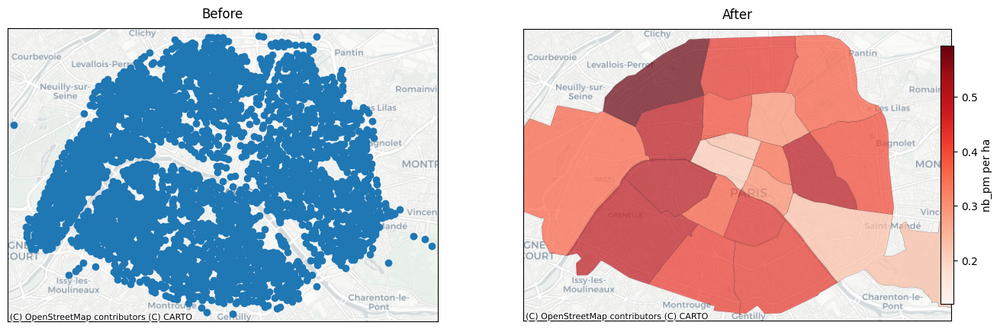

In [14]:
# Creating ratio indicators to display agregated data in choroplete map style
unit = 'ID'
value = 'nb_pm'
horo_agr = horo_enr.groupby([unit]).sum(['nb_pm'])
fig = plt.figure(1, (16, 14))
horo.to_crs(crs="EPSG:3857", inplace=True)

mun.to_crs(crs="EPSG:2154",inplace=True)
mun['area'] = mun['geometry'].area/10000 #ha

neigh.to_crs(crs="EPSG:2154",inplace=True)
neigh['area'] = neigh['geometry'].area/10000

iris.to_crs(crs="EPSG:2154",inplace=True)
iris['area'] = iris['geometry'].area/10000

if unit == 'code_iris':
    unit_to_disp = iris.merge(right=horo_agr, how='left', on = 'code_iris')
elif unit == 'n_sq_qu':
    unit_to_disp = neigh.merge(right=horo_agr, how='left', on = 'n_sq_qu')
else:
    unit_to_disp = mun.merge(right=horo_agr, how='left', on = 'ID')
unit_to_disp['density'] = unit_to_disp[value]/unit_to_disp['area']
unit_to_disp = unit_to_disp.dropna()
unit_to_disp = unit_to_disp.reset_index(drop = True)

def multipolygon_to_polygon(geom): # function that transform MultiPolygon geometry to Polygon
    if isinstance(geom, MultiPolygon):
        return geom.geoms[0]
    return geom

unit_to_disp.loc[:,'geometry'] = unit_to_disp.loc[:,'geometry'].apply(multipolygon_to_polygon) 
unit_to_disp.to_crs(crs="EPSG:3857", inplace=True)

sub1 = fig.add_subplot(121)
sub1.set_title('Before', pad=10, family='sans-serif')
sub1.scatter(x=np.asarray(horo.geometry.get_coordinates())[:,:1], y= np.asarray(horo.geometry.get_coordinates())[:,-1])
ctx.add_basemap(sub1,source=ctx.providers.CartoDB.Positron)
sub1.axes.get_xaxis().set_visible(False)
sub1.axes.get_yaxis().set_visible(False)
sub1.set_aspect('equal')
sub1.set_xlim(left=249654, right=272000)
sub1.set_ylim(bottom=6243332, top=6258584)

sub2 = fig.add_subplot(122)
sub2.set_title('After', pad=10, family='sans-serif')
cmap = plt.get_cmap('Reds')
norm = mcolors.Normalize(vmin=unit_to_disp['density'].min(), vmax=unit_to_disp['density'].max())

for i in range(len(unit_to_disp)):
    color_value = unit_to_disp.loc[i, 'density']/unit_to_disp.loc[:, 'density'].max()
    color = cmap(color_value)

    poly = Path.make_compound_path(Path(np.asarray(unit_to_disp.geometry[i].exterior.coords)[:, :2]),*[Path(np.asarray(ring.coords)[:, :2]) for ring in unit_to_disp.geometry[i].interiors])
    sub2.add_patch(PathPatch(poly, facecolor= color, edgecolor='black',linewidth = 0.15, alpha = 0.7))

mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array(unit_to_disp['density'])
cbar = fig.colorbar(mappable, ax = sub2, fraction=0.03, pad=-0.025, orientation='vertical')
cbar.set_label(f'{value} per ha')  

sub2.axes.get_xaxis().set_visible(False)
sub2.axes.get_yaxis().set_visible(False)
sub2.set_aspect('equal') 
sub2.set_xlim(left=249654, right=272000)
sub2.set_ylim(bottom=6243332, top=6258584)
ctx.add_basemap(sub2,source=ctx.providers.CartoDB.Positron)
plt.show()


We can identify two main problems for this technique :
- There are not always administrative/statistical units available for the desired zone
- Sometimes there are big size differencies between units, which make the spatial distribution of the datas harder to see (which can be partially tackle by creating ratio indicators)

For those reason, it can be interesting to agregate our points into regular geographical entities, such as the cells of a grid 

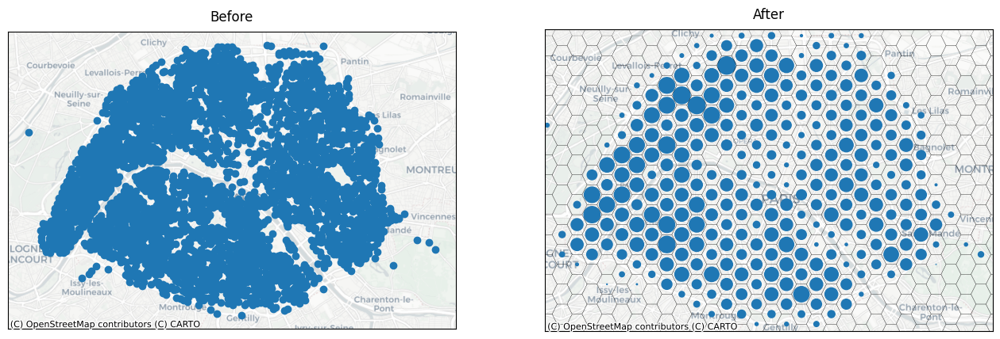

In [12]:
# Using the Label Grid algorithm to aggregate datas 
value = 'sum_places'
horo_value = horo_value.rename(columns={"nb_places":"value"}) 
lg = c4.LabelGrid(horo_value, width = 500, height = 500, typ="hexagonal", mode='aggregation')
lg.set_point_label_grid()
grid = lg.getGrid()
res = lg.getPointResults()

extent = horo.total_bounds
fig, axs = plt.subplots(1, 2, figsize = (16,10))

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo.geometry.get_coordinates())[:,:1], y= np.asarray(horo.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	


axs[1].set_title('After', pad=10, family='sans-serif')
if value == 'radius':
    axs[1].scatter(x=np.asarray(res.geometry.get_coordinates())[:,:1], y= np.asarray(res.geometry.get_coordinates())[:,-1], s=res[value]*2.5)
else:
    axs[1].scatter(x=np.asarray(res.geometry.get_coordinates())[:,:1], y= np.asarray(res.geometry.get_coordinates())[:,-1], s=res[value]*0.15)
for i in range(len(grid)):
    poly = Path.make_compound_path(Path(np.asarray(grid.geometry[i].exterior.coords)[:, :2]),*[Path(np.asarray(ring.coords)[:, :2]) for ring in grid.geometry[i].interiors])
    axs[1].add_patch(PathPatch(poly, facecolor= 'None', edgecolor='black',linewidth = 0.15))

ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	
plt.show()

Just like with administrative units, you can display the data in the form of colorized grid cells. Since each cell has the same size, it is possible to display the data without calculating a ratio indicator.

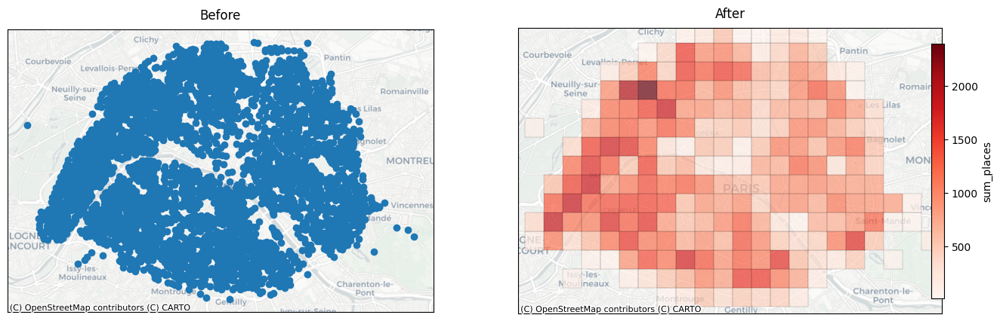

In [12]:
# Display the grid from Label Grid agregation 
value = 'sum_places'
lg = c4.LabelGrid(horo_value, width = 1000, height = 1000, typ="square", mode='aggregation')
lg.set_point_label_grid()
res = lg.getGridResults()

extent = horo.total_bounds
fig, axs = plt.subplots(1, 2, figsize = (16,10))

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo.geometry.get_coordinates())[:,:1], y= np.asarray(horo.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	


axs[1].set_title('After', pad=10, family='sans-serif')
cmap = plt.get_cmap('Reds')
norm = mcolors.Normalize(vmin=res[value].min(), vmax=res[value].max())

for i in range(len(res)):
    color_value = res.loc[i, value]/res.loc[:, value].max()
    color = cmap(color_value)

    poly = Path.make_compound_path(Path(np.asarray(res.geometry[i].exterior.coords)[:, :2]),*[Path(np.asarray(ring.coords)[:, :2]) for ring in res.geometry[i].interiors])
    axs[1].add_patch(PathPatch(poly, facecolor= color, edgecolor='black',linewidth = 0.15, alpha= 0.7))

mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array(res[value])
cbar = fig.colorbar(mappable, ax = axs[1], fraction=0.03, pad=-0.025, orientation='vertical')
cbar.set_label(f'{value}')

ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	
plt.show()

Agregation are good techniques for a strong level of generalisation, which is useful when the goal of the map is to give a global idea of the spatial distribution of a point data set. However, it is often hard to determine which level of agregation fits the most to the map : too big units/cells means masking local variation of the distribution of the datas, too small means too much details on the map.
To counter that problem and not having to chose an agregation level, the heat map technique can be used.  

### **d/** Heat map


The heatmap (or spatial smoothing), is a technique that consists of estimating the density of point data in every part of the map zone. Let's see the Kernel-density estimation (KDE), the most common technique to build heatmap :

In [16]:
#generate heatmap
horo_xy = horo.get_coordinates() #récup coordonnées des véhicules
horo_x = list(horo_xy['x']) #création d'une liste des x
horo_y = list(horo_xy['y']) #création d'une liste des y

size_of_grid = 200 #correspond à la taille du pixel dans la méthode des noyaux
h = 1000 #taille du rayon pour le calcul

lower_x=min(horo_x) #récupération de la valeur minimum de x pour la création de la grille
upper_x=max(horo_x) # //
lower_y=min(horo_y) # //
upper_y=max(horo_y) # //

#création de la grille
grid_of_x = np.arange(lower_x-h,upper_x+h,size_of_grid)
grid_of_y = np.arange(lower_y-h,upper_y+h,size_of_grid)
mesh_x,mesh_y = np.meshgrid(grid_of_x,grid_of_y)

#récupération du centre des cellules
x_centre = mesh_x + (size_of_grid/2)
y_centre = mesh_y + (size_of_grid/2)

#definition de la fonction de lissage par méthode des noyaux (quadratique)
def kernel(d,h):
  dn=d/h
  P=(15/16)*(1-dn**2)**2
  return P

#calcul densité pour chaque pixel
intensity_list = [] #liste allant recevoir les valeurs de densité de point pour chaque pixel
for i in range(len(x_centre)):
    intensity_row = []
    for j in range(len(x_centre[0])):
        kde_value_list = []
        for k in range(len(horo_x)):
            d = np.sqrt((x_centre[i][j]-horo_x[k])**2+(y_centre[i][j]-horo_y[k])**2)
            if d <= h:
                p= kernel(d,h)
                kde_value_list.append(p)

        total_density = sum(kde_value_list)
        intensity_row.append(total_density)
    intensity_list.append(intensity_row)

# transformation de la liste des densités en np.array
intensity= np.array(intensity_list)

# créer un masque pour les valeurs d'intensité supérieures à 0
mask = intensity > 0

# Remplacer les valeurs masquées par NaN
intensity_masked = np.where(mask, intensity, np.nan)

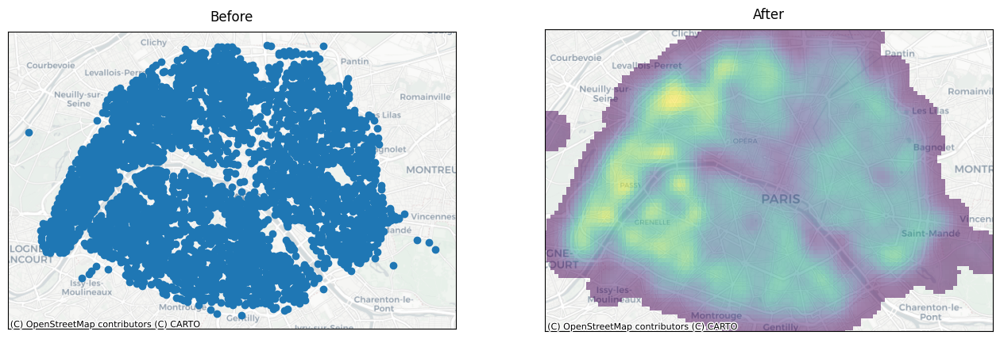

In [28]:
# Display the heat map
extent = horo.total_bounds
fig, axs = plt.subplots(1, 2, figsize = (16,10))

axs[0].set_title('Before', pad=10, family='sans-serif')
axs[0].scatter(x=np.asarray(horo.geometry.get_coordinates())[:,:1], y= np.asarray(horo.geometry.get_coordinates())[:,-1])
ctx.add_basemap(axs[0],source=ctx.providers.CartoDB.Positron)
fig.axes[0].get_xaxis().set_visible(False)
fig.axes[0].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	

axs[1].set_title('After', pad=10, family='sans-serif')
heatmap = plt.pcolormesh(mesh_x,mesh_y,intensity_masked) #affichage de la heatmap
heatmap.set_alpha(0.5) #configuration de la transparence de la heatmap
plt.colorbar(fraction=0.03, pad=-0.02) #affichage de la légende de la heatmap
ctx.add_basemap(axs[1],source=ctx.providers.CartoDB.Positron)
fig.axes[1].get_xaxis().set_visible(False)
fig.axes[1].get_yaxis().set_visible(False)
plt.xlim(extent[0]-350, extent[2]+350)
plt.ylim(extent[1]-350, extent[3]+350)	
plt.show()



## 📍**Part 3 :** Clustering methods with CartAGen